<a href="https://colab.research.google.com/github/S-MANU/Data-Sets/blob/main/CardioVascular.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name** -

Project Type : Classification

Contribution : Individual

Member       : Manu S

# **Problem Summary**

Heart disease is a group of diseases related to cardiovascular diseases, manifested by a violetion of the normal functioning of the heart. May be caused by damage to the  epicardium, oericardium, myocardium, endocardium, valvular apparatus of the heart, heart vessesls.

Heart disease can last a long time in a latent form, clinically not manifesting itself.Along with carious tumors, these diseases are today the main cause of premature death in developed countries.

The ininterrupted operation of the circulatory system, which consists of the heart as a muscle pump and a network of blood vessels, is a necessary condition for the normal functioning of the body.

Accordning to the National Heart, Lung and Blood Institute in Framingham (USA), the most important factors in the development of cardiovascular disease in humans are obesity, sedentary lifestyle and smoking.

# **GitHub Link**

# **Problem Statement**

Coronary Heart Disease (CHD) remains a critical global health concern, responsible for a substantial portion of cardiovascular-related morbidity and mortality. Identifying individuals at risk of developing CHD is paramount for timely intervention and prevention efforts, This project aims to harness the power of data analysis and predictive modeling to better understand the factors associated with Ten-Year CHDrisk and to build a reliable predictive model.

## **Let's Begin**

## **1.Know Your Data**

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score,precision_score,classification_report,roc_auc_score,roc_curve
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVC

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import warnings

warnings.filterwarnings('ignore')



### Dataset Loading

In [2]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/The Final Submission/data_cardiovascular_risk.csv')

### Dataset First View

In [3]:
df.head()

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,0,64,2.0,F,YES,3.0,0.0,0,0,0,221.0,148.0,85.0,NaN,90.0,80.0,1
1,1,36,4.0,M,NO,0.0,0.0,0,1,0,212.0,168.0,98.0,29.77,72.0,75.0,0
2,2,46,1.0,F,YES,10.0,0.0,0,0,0,250.0,116.0,71.0,20.35,88.0,94.0,0
3,3,50,1.0,M,YES,20.0,0.0,0,1,0,233.0,158.0,88.0,28.26,68.0,94.0,1
4,4,64,1.0,F,YES,30.0,0.0,0,0,0,241.0,136.5,85.0,26.42,70.0,77.0,0


This is the first 5 rows of the dataset, we can see some object type integers too with number integer and float variables.

In [4]:
df.tail()

,id,age,education,sex,is_smoking,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
3385,3385,60,1.0,F,NO,0.0,0.0,0,0,0,261.0,123.5,79.0,29.28,70.0,103.0,0
3386,3386,46,1.0,F,NO,0.0,0.0,0,0,0,199.0,102.0,56.0,21.96,80.0,84.0,0
3387,3387,44,3.0,M,YES,3.0,0.0,0,1,0,352.0,164.0,119.0,28.92,73.0,72.0,1
3388,3388,60,1.0,M,NO,0.0,NaN,0,1,0,191.0,167.0,105.0,23.01,80.0,85.0,0
3389,3389,54,3.0,F,NO,0.0,0.0,0,0,0,288.0,124.0,77.0,29.88,79.0,92.0,0


This is last 5 rows of the data and we can see some NaN in these rows.

### Dataset Rows and Columns Count

In [ ]:
df.shape

(3390, 17)

We can see there are 17 columns and 3390 rows in this dataset.

### Dataset Information

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3390 entries, 0 to 3389
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               3390 non-null   int64  
 1   age              3390 non-null   int64  
 2   education        3303 non-null   float64
 3   sex              3390 non-null   object 
 4   is_smoking       3390 non-null   object 
 5   cigsPerDay       3368 non-null   float64
 6   BPMeds           3346 non-null   float64
 7   prevalentStroke  3390 non-null   int64  
 8   prevalentHyp     3390 non-null   int64  
 9   diabetes         3390 non-null   int64  
 10  totChol          3352 non-null   float64
 11  sysBP            3390 non-null   float64
 12  diaBP            3390 non-null   float64
 13  BMI              3376 non-null   float64
 14  heartRate        3389 non-null   float64
 15  glucose          3086 non-null   float64
 16  TenYearCHD       3390 non-null   int64  
dtypes: float64(9),

### What Did You Know Your Dataset

We have 3390 rows and 17 columns in this dataset and it is a big data set.

We can see that there are 9 types of floats, 6 types of integer 2 types of object and 3390 entries.

There is a null values  in this dataset.



### ***Understanding The Variables***

### Variable Description

In [ ]:
df.describe()

,id,age,education,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
count,3390.000000,3390.000000,3303.000000,3368.000000,3346.000000,3390.000000,3390.000000,3390.000000,3352.000000,3390.00000,3390.000000,3376.000000,3389.000000,3086.000000,3390.000000
mean,1694.500000,49.542183,1.970936,9.069477,0.029886,0.006490,0.315339,0.025664,237.074284,132.60118,82.883038,25.794964,75.977279,82.086520,0.150737
std,978.753033,8.592878,1.019081,11.879078,0.170299,0.080309,0.464719,0.158153,45.247430,22.29203,12.023581,4.115449,11.971868,24.244753,0.357846
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.50000,48.000000,15.960000,45.000000,40.000000,0.000000
25%,847.250000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.00000,74.500000,23.020000,68.000000,71.000000,0.000000
50%,1694.500000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.50000,82.000000,25.380000,75.000000,78.000000,0.000000
75%,2541.750000,56.000000,3.000000,20.000000,0.000000,0.000000,1.000000,0.000000,264.000000,144.00000,90.000000,28.040000,83.000000,87.000000,0.000000
max,3389.000000,70.000000,4.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.00000,142.500000,56.800000,143.000000,394.000000,1.000000


We can see the highest age is 70, and some unnecessary columns we can drop.

We can see many columns like diabetes, BPMeds etc max is it means that we can see only 2 type of values here wither 0 or 1.

Sex: male or female('M' or 'F')

Age: Age of the patient.

Education: Education of the patient.

is_smoking: Whether or not the patient is current smoker ('YES' or "NO")

Cigs Per Day: The number of cigarettes that person smoked on average in one day.

BP Meds: Whether or not the patient was on bloodpressure medication.

Prevalent Stroke: Whether or not the patient had previously had a stroke.

Prevalent Hyp: Whether or not the patient was hypertensive.

Diabetes: Whether or not the patient had diabetes.

Tot Chol: Total cholesterol level.

Sys Bp: Systolic blood pressure.

Dia BP: Diastolic blood pressure.

BMI : Body Mass Index.

Heart Rate: heart rate.

Glucose: Glucose Level.

Desired Variable:
10-year risk of coronary heart disease CHD("1" means "Yes", "0" means "NO")


In [ ]:
# Datset Columns
df.columns

Index(['age', 'education', 'sex', 'is_smoking', 'cigsPerDay', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP',
       'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD'],
      dtype='object')

### Check Valuecounts for each variable

In [ ]:
# Selected variables
categorical_feature = ['education', 'sex', 'is_smoking', 'BPMeds',
       'prevalentStroke', 'prevalentHyp', 'diabetes',
        'TenYearCHD' ]

In [ ]:
# For loop to find the valuecounts
for feature in categorical_feature:
  print(feature, ':')
  print(df[feature].value_counts())
  print("__________")

education :
1.0    1240
2.0     874
3.0     487
4.0     326
Name: education, dtype: int64
__________
sex :
F    1620
M    1307
Name: sex, dtype: int64
__________
is_smoking :
NO     1480
YES    1447
Name: is_smoking, dtype: int64
__________
BPMeds :
0.0    2839
1.0      88
Name: BPMeds, dtype: int64
__________
prevalentStroke :
0    2909
1      18
Name: prevalentStroke, dtype: int64
__________
prevalentHyp :
0    2007
1     920
Name: prevalentHyp, dtype: int64
__________
diabetes :
0    2848
1      79
Name: diabetes, dtype: int64
__________
TenYearCHD :
0    2483
1     444
Name: TenYearCHD, dtype: int64
__________


We can see in the above categorical variables we have only two type of values. We have values like 0 or 1 and Yes or No and F and M. here 0 indicates No and 1 indicates Yes.

In [ ]:
#To find minimum age
df['age'].min()

32

In [ ]:
# To find maximum age
df['age'].max()

70

The patient whose maximum age is 70 and minimum age is 32 in this dataset.

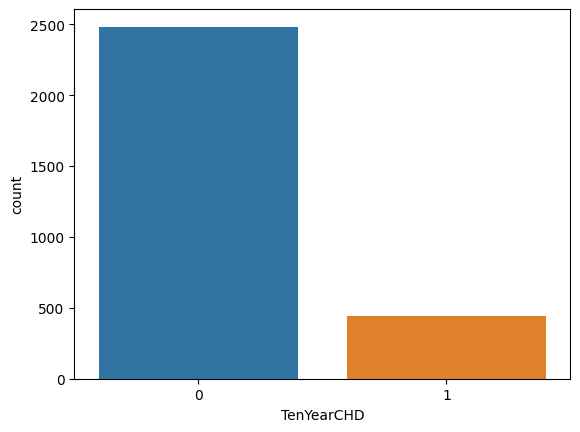

In [ ]:
# Graph to find the value counts of target variable
sns.countplot(x="TenYearCHD", data=df)
plt.show()
cases = df.TenYearCHD.value_counts()
plt.show()

In the above graph we can see there are 2483 patients without heart disease and 444 patients with heart disease. This column we can take also as target which represent 10 year risk of coronary geart disease. 0 means "NO" and 1 means "Yes".

### ***Data Wrangling***

In [ ]:
# lets drop the unnecessary columns
df.drop(['id'], axis=1, inplace=True)

In [ ]:
#finding null values
missing_data = df.isnull().sum()
missing_data

age                  0
education           87
sex                  0
is_smoking           0
cigsPerDay          22
BPMeds              44
prevalentStroke      0
prevalentHyp         0
diabetes             0
totChol             38
sysBP                0
diaBP                0
BMI                 14
heartRate            1
glucose            304
TenYearCHD           0
dtype: int64

We can see only the glucose has the highest null values 304, compare to other variables.

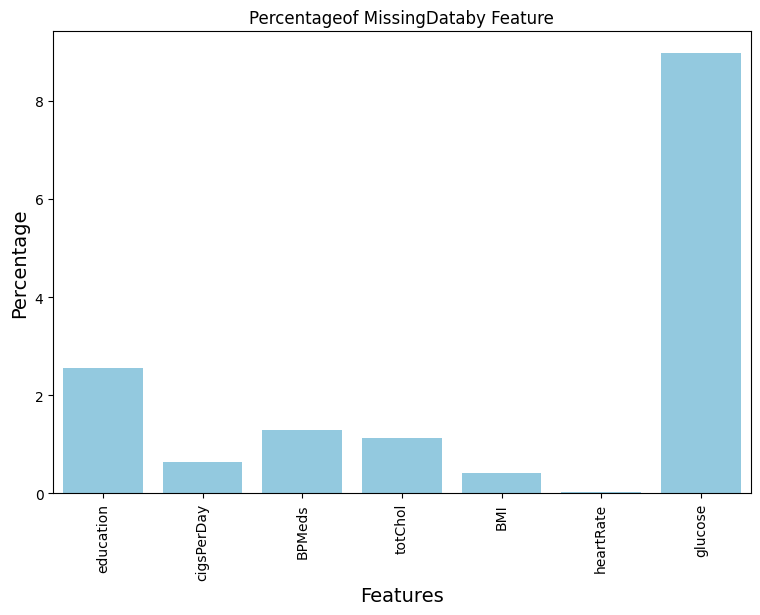

In [ ]:
# Calculate the percentage of missing data
missing_data = df.isnull().sum()
missing_data = missing_data[missing_data > 0]
missing_data = (missing_data / len(df)) * 100

# Create a bar plot to visualise the percentage
plt.figure(figsize=(9,6))
sns.barplot(x=missing_data.index, y=missing_data, color='skyblue')
plt.title('Percentageof MissingDataby Feature')
plt.xlabel('Features', fontsize=14)
plt.ylabel("Percentage", fontsize=14)
plt.xticks(rotation=90)
plt.show()

We can see that glucose has the highest null value with 9%, followed by education 3% so in this big data set it is too less, we can drop the null values here.

In [ ]:
#Drop the null values
df.dropna(axis=0, inplace=True)

In [ ]:
#checking the null values
df.isnull().sum()

age                0
education          0
sex                0
is_smoking         0
cigsPerDay         0
BPMeds             0
prevalentStroke    0
prevalentHyp       0
diabetes           0
totChol            0
sysBP              0
diaBP              0
BMI                0
heartRate          0
glucose            0
TenYearCHD         0
dtype: int64

In [ ]:
df.shape

(2927, 16)

Let's change the sex and is_smoking object type to intger type in the data.

In [ ]:
# Encoding 'Sex' column
df['sex'] = df['sex'].apply(lambda x : 0 if x == 'F' else 1)

In [ ]:
# Encoding 'is_smoking' column
df['is_smoking'] = df['is_smoking'].apply(lambda x : 0 if x == 'NO' else 1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2927 entries, 1 to 3389
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              2927 non-null   int64  
 1   education        2927 non-null   float64
 2   sex              2927 non-null   int64  
 3   is_smoking       2927 non-null   int64  
 4   cigsPerDay       2927 non-null   float64
 5   BPMeds           2927 non-null   float64
 6   prevalentStroke  2927 non-null   int64  
 7   prevalentHyp     2927 non-null   int64  
 8   diabetes         2927 non-null   int64  
 9   totChol          2927 non-null   float64
 10  sysBP            2927 non-null   float64
 11  diaBP            2927 non-null   float64
 12  BMI              2927 non-null   float64
 13  heartRate        2927 non-null   float64
 14  glucose          2927 non-null   float64
 15  TenYearCHD       2927 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 388.7 KB


We can see in the info that we changed the object type to integer type to help our analysis purpose.

### What all manipulates you done and insights you found

We saw the null values which are very less in number so we drop those values and it won't affects our dataset.

We drop the id column which is not necessary for analysis.

We encode the object values to integer values for our analysis.

Now our data is clean and ready for the exploration.

## ***Data Visualization, Storytelling and Experimenting with Charts: Understand the Relationships Between Variables***

###CHART-1

## Treating Anomalies in the Data

We should identify the true outliers or exceptional or abormal experience and keep them aside.

In [ ]:
# Create a copy of the DataFrame for outlier detection
outlier_detect_df = df.copy()

# Iterate through selected columns
for col in ['age', 'cigsPerDay', 'diabetes', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose']:
  # Calculate the limit for outliers
  limit = outlier_detect_df[col].min() + (outlier_detect_df[col].max() - outlier_detect_df[col].min())/2

  # Categorize value as 'low' or 'high'
  outlier_detect_df[col] = outlier_detect_df[col].apply(lambda x : 'low' if x < limit else 'high')


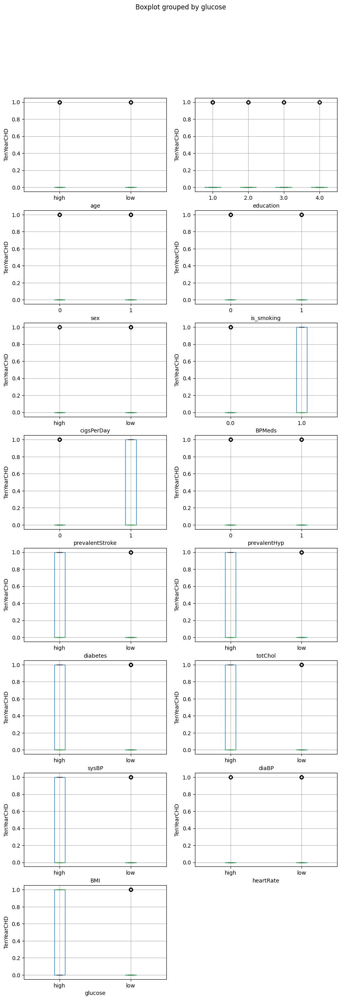

In [ ]:
# Plotting outliers
fig = plt.figure(figsize=(10,30))
a=1
for col in outlier_detect_df.columns[:-1]:
  plt.subplot(8,2,a)
  ax = fig.gca()
  outlier_detect_df.boxplot(column = 'TenYearCHD', by = col, ax= ax)
  ax.set_title('');
  ax.set_ylabel('TenYearCHD')
  a = a+1
plt.show()

For most of the features , class 1 targets are outliers, Thus we need more experience with class 1 target to bring balance in prediction.

### CHART-2

## Final Feature Selection From The Data

Now we need to understand the distribution of the variables, relationship between variables etc for the decision tranformation, scaling and final selection features.

<Figure size 700x700 with 0 Axes>

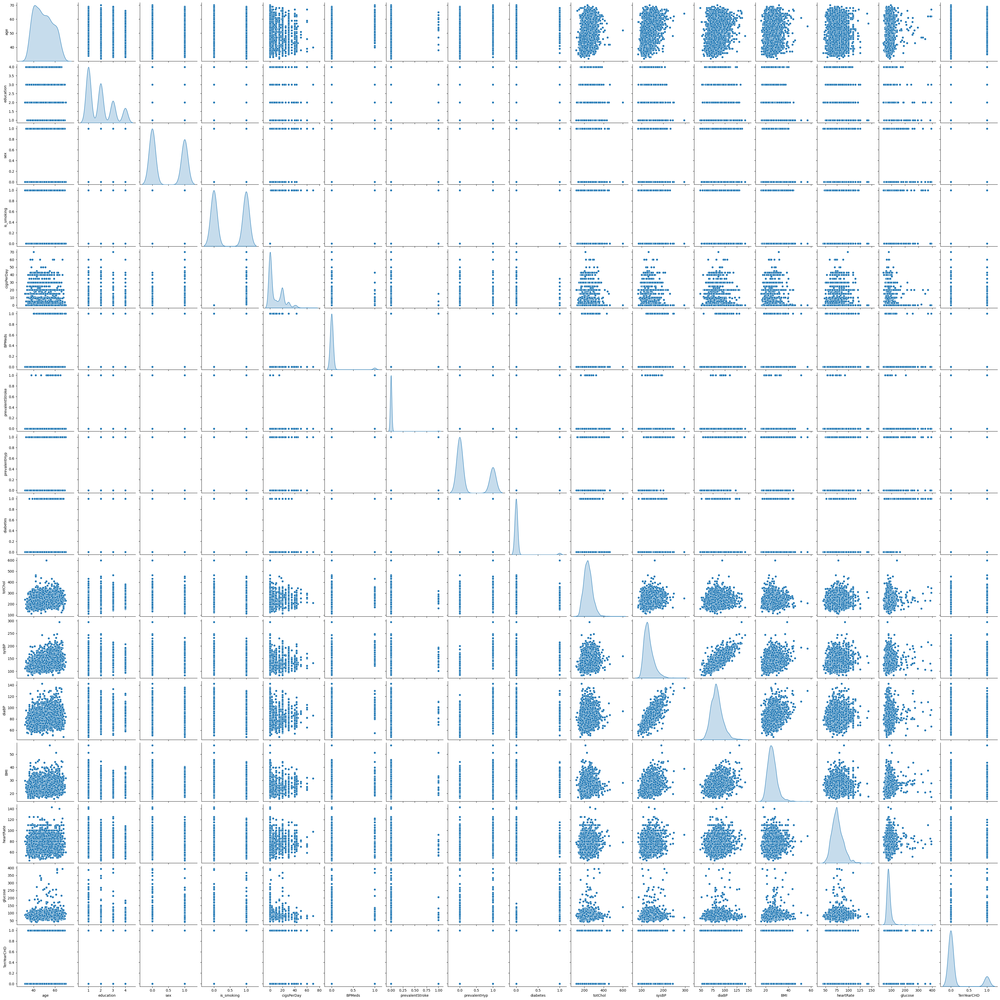

In [ ]:
# Univariant, bivariant and multivariant analysis in a single plot
plt.figure(figsize=(7,7))
sns.pairplot(data=df, kind='scatter', diag_kind='kde')
plt.show()

###CHART - 3

## Looking For Normal Distribution Features

In [ ]:
# For the continuous variables
numeric_category = ["age", 'cigsPerDay', 'totChol', 'sysBP','diaBP', 'BMI','heartRate','glucose']

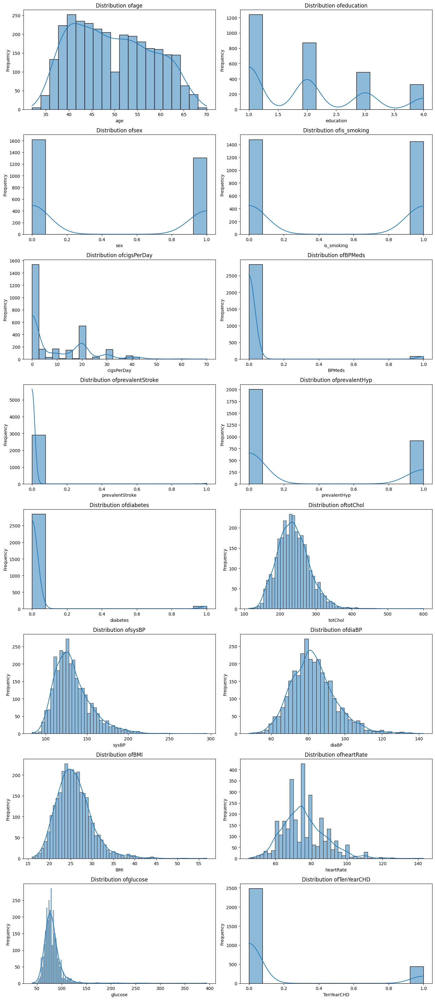

In [ ]:
numeric_category = df.select_dtypes(include='number').columns
num_plots = len(numeric_category)
fig, axes = plt.subplots(nrows=num_plots // 2, ncols=2, figsize=(14, num_plots * 2))

axes = axes.flatten()

# Plot each numeric feature
for i, col in enumerate(numeric_category):
  sns.histplot(df[col], kde=True, ax=axes[i])
  axes[i].set_title(f'Distribution of{col}')
  axes[i].set_xlabel(col)
  axes[i].set_ylabel('Frequency')

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


The variable 'Cigarettes Per Day (CigsPerDay)' exhibits a highly uneven distribution.

Similarly, 'Heart Rate' also displays an uneven distribution.

In contrast, "Glucose', "BMI"(Body Mass Index), 'Diastolic Blood Pleassure(diaBp), 'Systolic Blood Pressure (sysBP), and 'Total Cholesterol (totChol) demonstrate more even distributions

### CHART -4

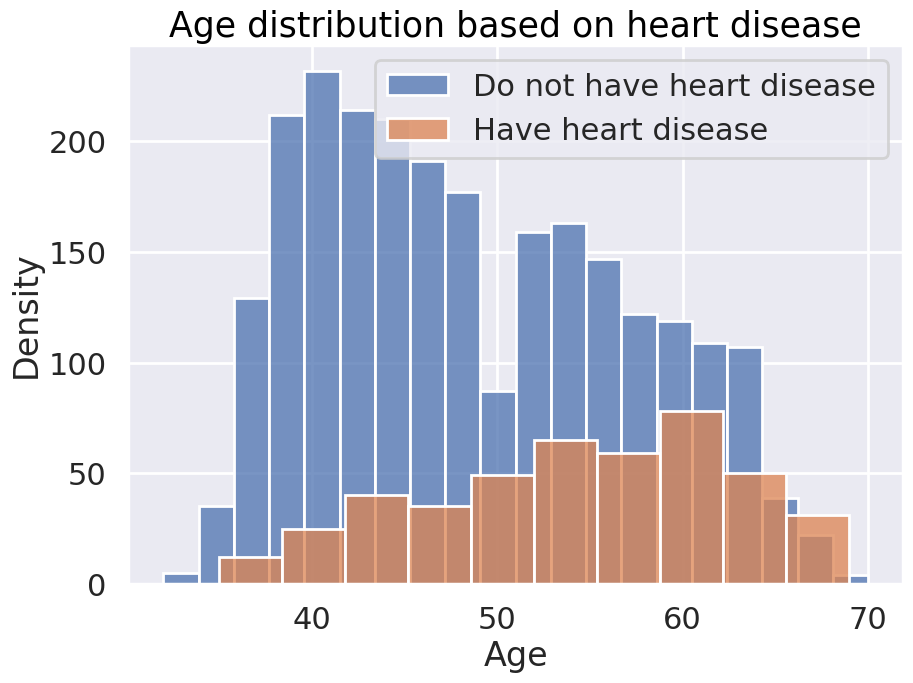

In [ ]:
sns.set_theme(context='poster')
plt.figure(figsize=(10,7))
plt.title('Age distribution based on heart disease', color = "Black", fontsize=25)

sns.histplot(df[df['TenYearCHD'] == 0]['age'], label= 'Do not have heart disease')
sns.histplot(df[df['TenYearCHD']== 1]['age'], label = 'Have heart disease')

plt.xlabel('Age')
plt.ylabel('Density')
plt.legend()
plt.show()


We can see in the graph that people in the age between 50 and 60 has the most number heart disease

CHART - 5

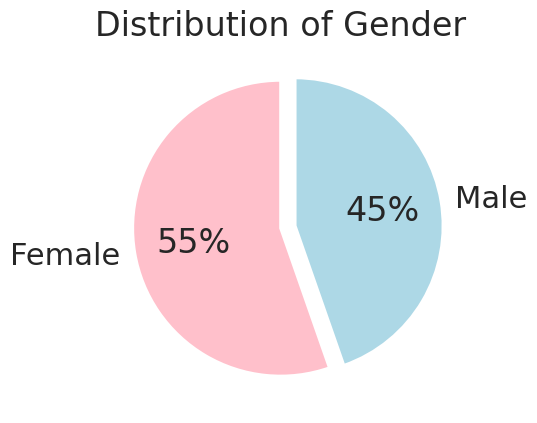

In [ ]:
#List of the sex column
gender = ['Female', 'Male']

# Make an object which storesthe value count of the elements in the 'sex' column
gender_data = pd.Series(df['sex']).value_counts()

# Plottingthe pie chart
plt.pie(gender_data, labels=gender, autopct='%.0f%%', colors=['pink', 'lightblue'], startangle=90, explode=(0, 0.1))

#Add a title
plt.title('Distribution of Gender')

plt.show()

We can see that the distribution of male and femal in the data.

CHART - 6

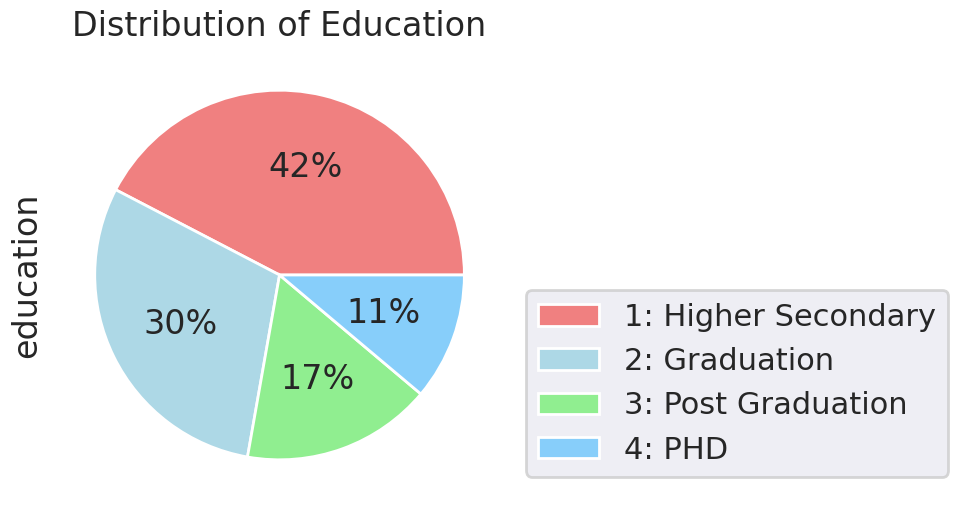

In [ ]:
# List for the education column
education_labels = ['1: Higher Secondary', '2: Graduation', '3: Post Graduation', '4: PHD']

# Plotting pie chart directly from value counts
df['education'].value_counts().plot.pie(labels=None, autopct='%.0f%%', figsize=(6,6), colors = ['lightcoral', 'lightblue', 'lightgreen', 'lightskyblue'])

# Add title and legend
plt.title('Distribution of Education')
plt.legend(education_labels, loc='upper left', bbox_to_anchor=(1, 0.5))

plt.show()

We can see the education distribution in the data. People who did Higher Secondery is the highest, next is the Graduation.

### CHART - 7

<Axes: xlabel='is_smoking', ylabel='count'>

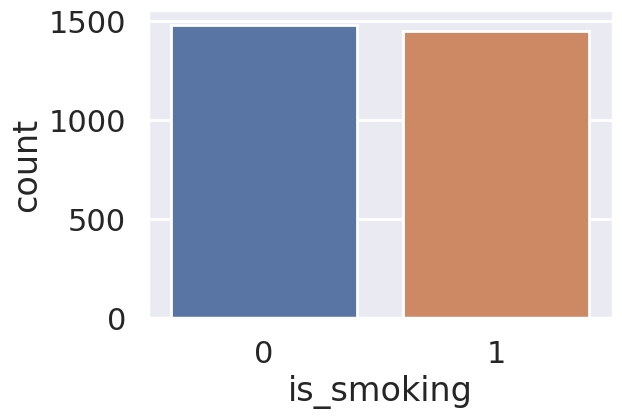

In [ ]:
plt.figure(figsize=(6,4))
sns.countplot(data=df, x='is_smoking')

people who is not smoke almost equal to people who smokes in the data

###CHART - 8

### Looking For Relation between dependent and independent

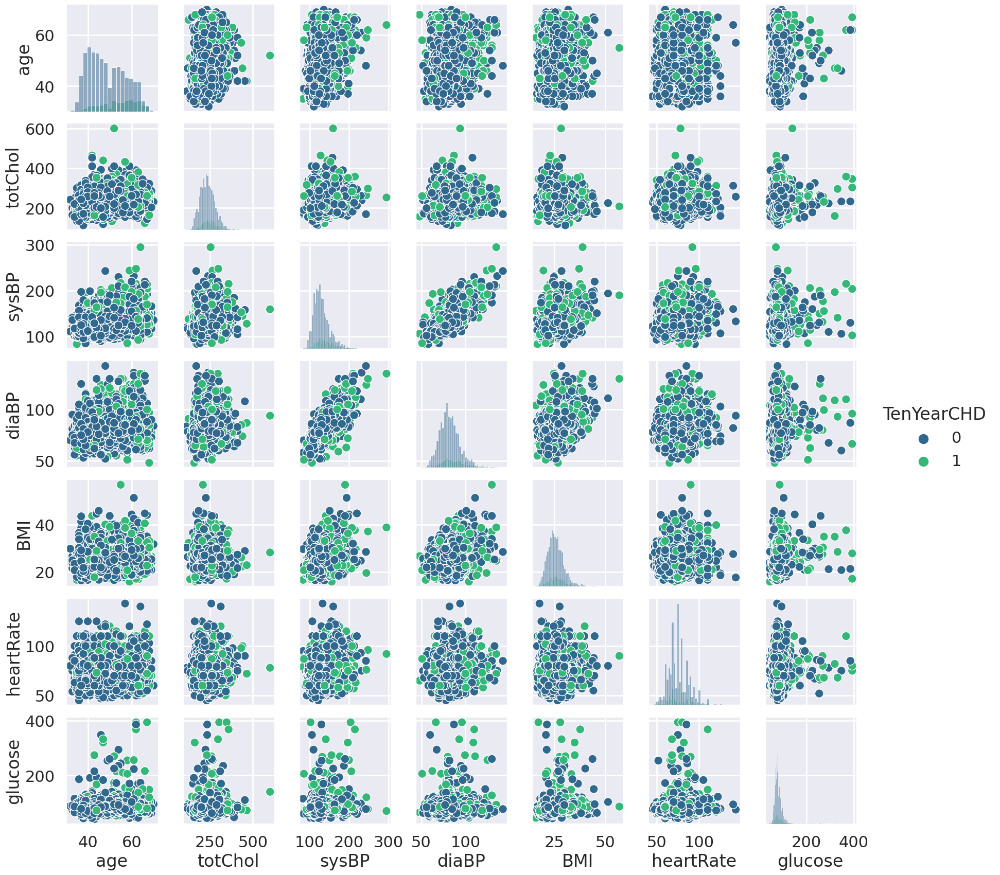

In [ ]:
# Defining the feture to include in the pair plot
selected_features = ['age', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose', 'TenYearCHD']

# Creating pair plot
sns.pairplot(df[selected_features], hue = 'TenYearCHD', palette = 'viridis', diag_kind = 'hist', height = 2.5 )

# Show he plot
plt.show()

In the above graph we can see that the relation between each variable with target variable that is 10 years of heart disease. We can see that total cholestral, glucose, sysBp, diaBP has the more green compare to other variables.

###CHART - 9

Text(115.36573456790124, 0.5, 'Values')

<Figure size 1500x1000 with 0 Axes>

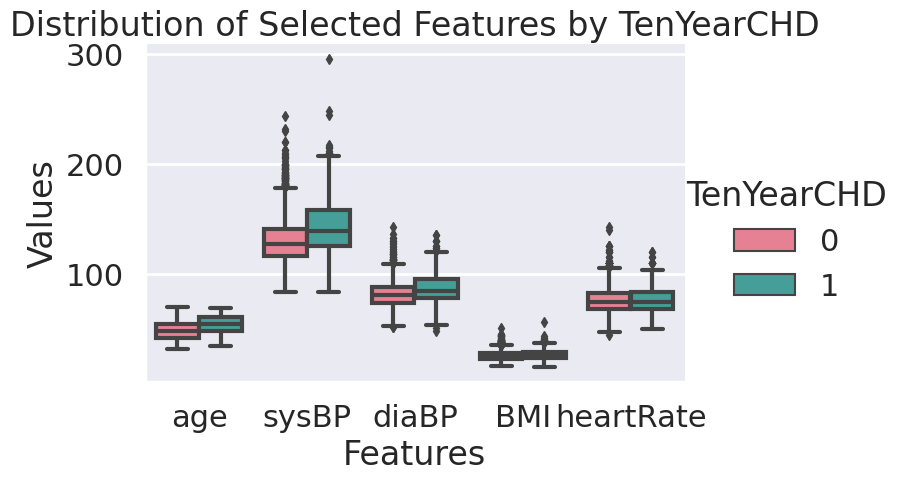

In [ ]:
selected_features = ['age', 'sysBP', 'diaBP', 'BMI','heartRate', 'TenYearCHD']

# Melt the dataframe to long format for easier plotting
melted_df = pd.melt(df[selected_features], id_vars = 'TenYearCHD')

# Create a categorical plot (boxplot)
plt.figure(figsize=(15,10))
sns.catplot(x='variable', y='value', hue ='TenYearCHD', data=melted_df, kind='box', height=5, aspect=1.5, palette='husl')

# Add title and labels
plt.title('Distribution of Selected Features by TenYearCHD')
plt.xlabel('Features')
plt.ylabel('Values')

In the above graph we can see that, the risk is very high in sysBP and diaBP compare to others. 0 means low risk 1 means high risk.

### CHART - 10

<Figure size 2000x1500 with 0 Axes>

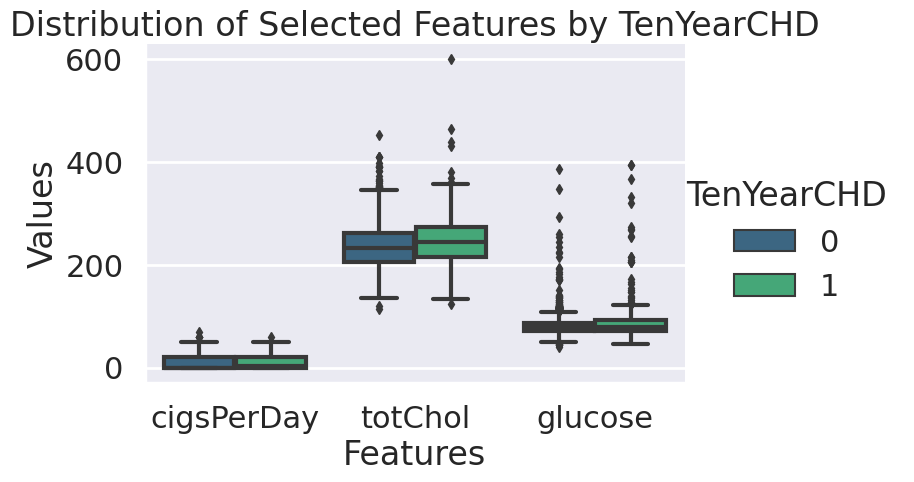

In [ ]:
selected_feature = ['cigsPerDay', 'totChol', 'glucose', 'TenYearCHD']

# Melting the dataframe
melt_df = pd.melt(df[selected_feature] , id_vars='TenYearCHD')

#plotting
plt.figure(figsize=(20,15))
sns.catplot(x='variable', y='value', hue='TenYearCHD', data=melt_df, kind='box', height=5, aspect=1.5, palette='viridis')

#Add title and labels
plt.title('Distribution of Selected Features by TenYearCHD')
plt.xlabel('Features')
plt.ylabel('Values')

plt.show()

Here also we can see that risk from cholestral and glucose is high.

CHART - 11

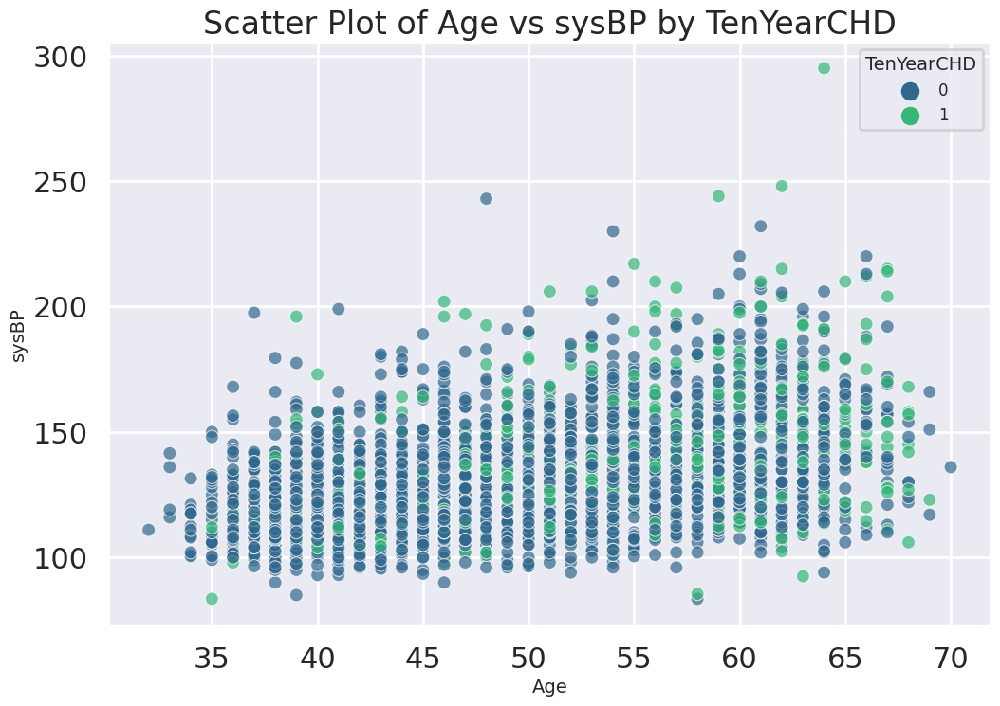

In [ ]:
# Joint plot for Age v/s sysBp
plt.figure(figsize=(12,8))

# Use scatter plot with maginal histograms
sns.scatterplot(data=df, x='age', y='sysBP', hue='TenYearCHD', palette='viridis', alpha=0.7,edgecolor='w', s=100)

# Add title and labels
plt.title('Scatter Plot of Age vs sysBP by TenYearCHD')
plt.xlabel('Age', fontsize=14)
plt.ylabel('sysBP', fontsize=14)

# Add a legend
plt.legend(title='TenYearCHD', title_fontsize='14', fontsize='12')

plt.show()

### CHART - 12

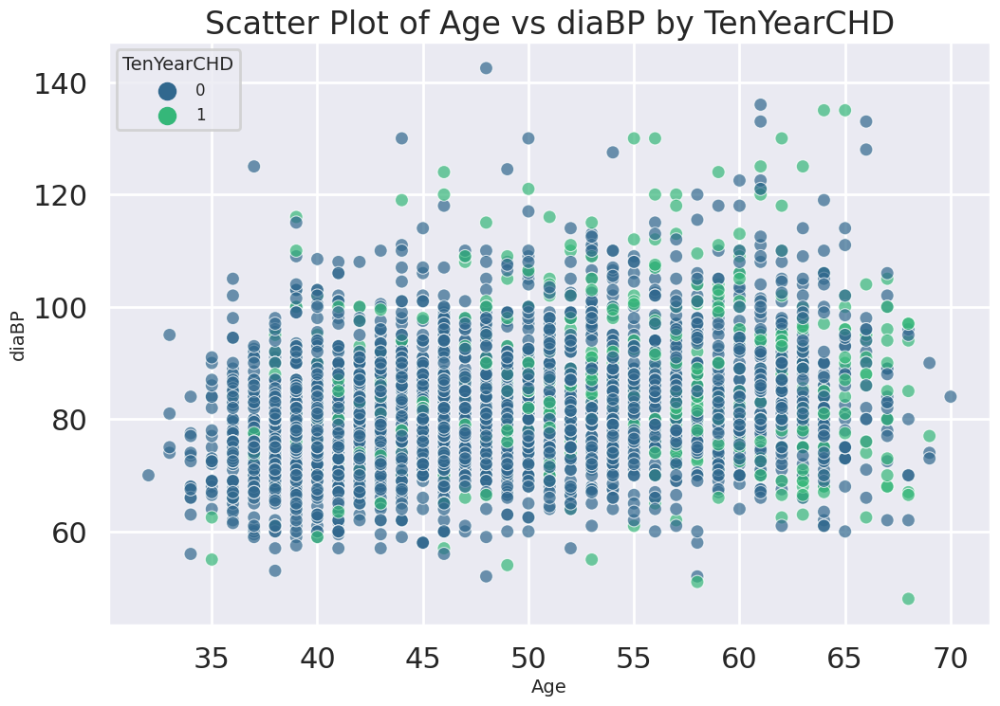

In [ ]:
# Joint plot for Age v/s diaBP
plt.figure(figsize=(12,8))

# Use scatter plot with maginal histograms
sns.scatterplot(data=df, x='age', y='diaBP', hue='TenYearCHD', palette='viridis', alpha=0.7,edgecolor='w', s=100)

# Add title and labels
plt.title('Scatter Plot of Age vs diaBP by TenYearCHD')
plt.xlabel('Age', fontsize=14)
plt.ylabel('diaBP', fontsize=14)

# Add a legend
plt.legend(title='TenYearCHD', title_fontsize='14', fontsize='12')

plt.show()

CHART - 13

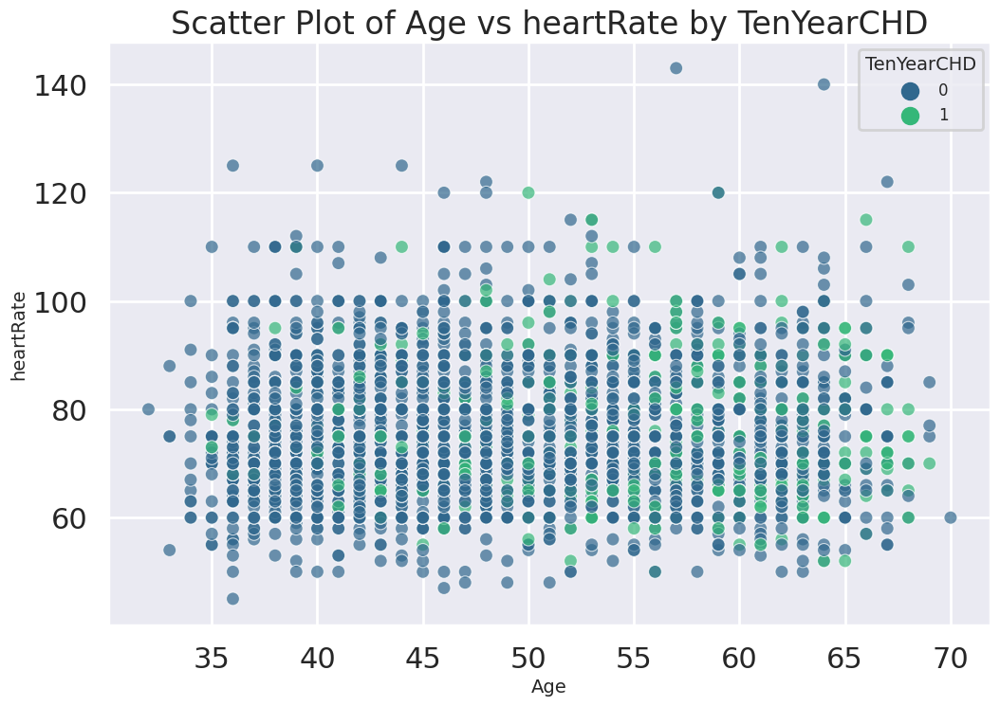

In [ ]:
# Joint plot for Age v/s heartRate
plt.figure(figsize=(12,8))

# Use scatter plot with maginal histograms
sns.scatterplot(data=df, x='age', y='heartRate', hue='TenYearCHD', palette='viridis', alpha=0.7,edgecolor='w', s=100)

# Add title and labels
plt.title('Scatter Plot of Age vs heartRate by TenYearCHD')
plt.xlabel('Age', fontsize=14)
plt.ylabel('heartRate', fontsize=14)

# Add a legend
plt.legend(title='TenYearCHD', title_fontsize='14', fontsize='12')

plt.show()

### CHART - 14

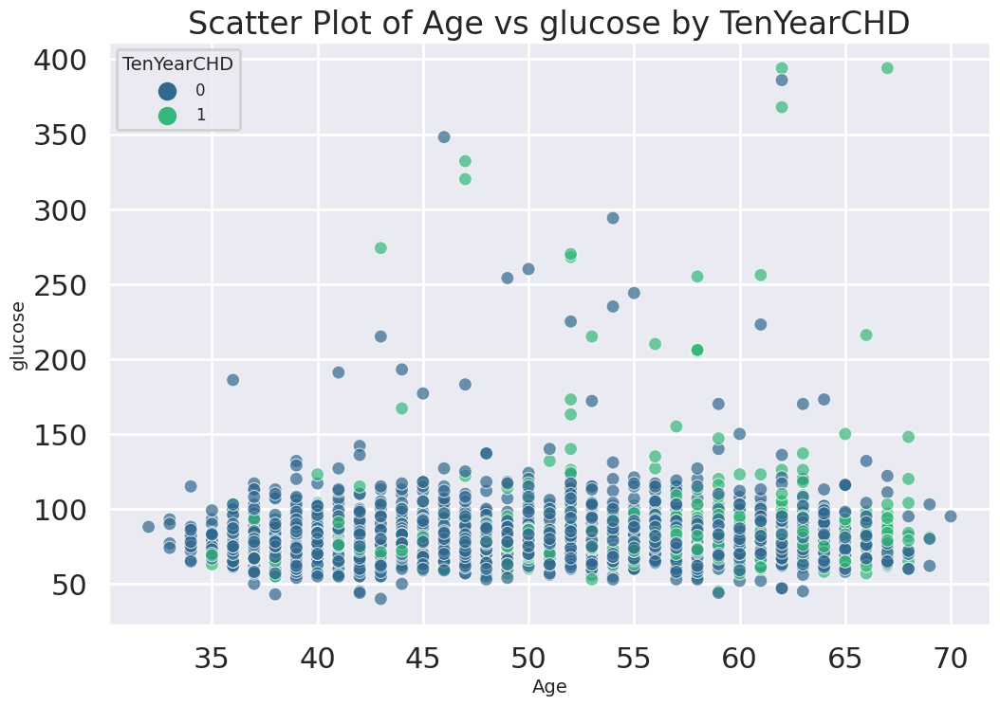

In [ ]:
# Joint plot for Age v/s glucose
plt.figure(figsize=(12,8))

# Use scatter plot with maginal histograms
sns.scatterplot(data=df, x='age', y='glucose', hue='TenYearCHD', palette='viridis', alpha=0.7,edgecolor='w', s=100)

# Add title and labels
plt.title('Scatter Plot of Age vs glucose by TenYearCHD')
plt.xlabel('Age', fontsize=14)
plt.ylabel('glucose', fontsize=14)

# Add a legend
plt.legend(title='TenYearCHD', title_fontsize='14', fontsize='12')

plt.show()

### CHART - 15

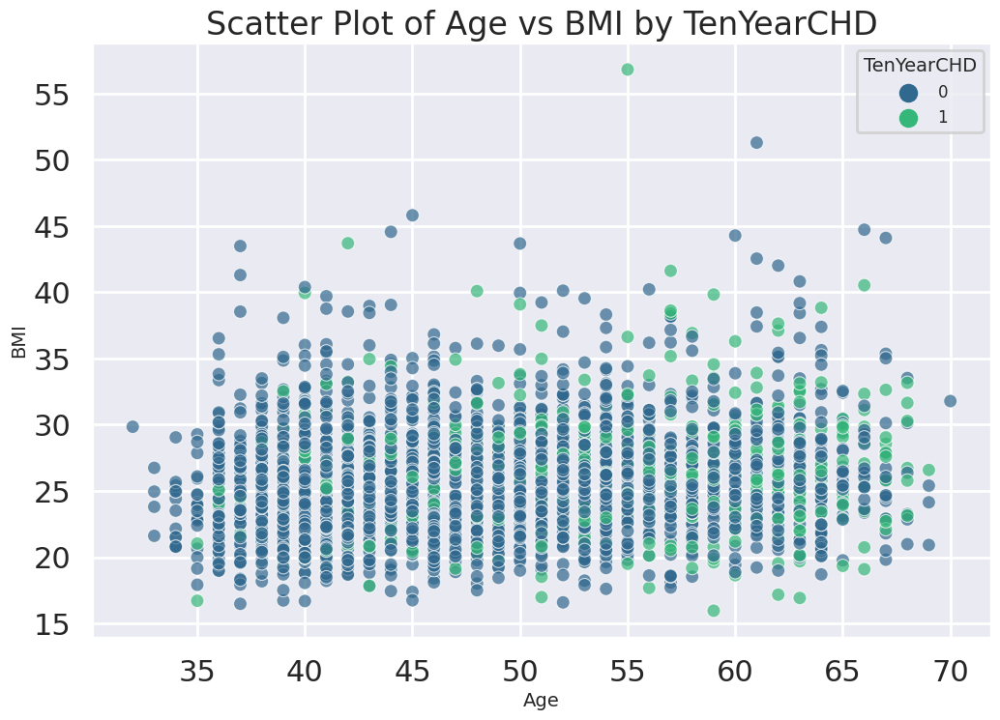

In [ ]:
# Joint plot for Age v/s BMI
plt.figure(figsize=(12,8))

# Use scatter plot with maginal histograms
sns.scatterplot(data=df, x='age', y='BMI', hue='TenYearCHD', palette='viridis', alpha=0.7,edgecolor='w', s=100)

# Add title and labels
plt.title('Scatter Plot of Age vs BMI by TenYearCHD')
plt.xlabel('Age', fontsize=14)
plt.ylabel('BMI', fontsize=14)

# Add a legend
plt.legend(title='TenYearCHD', title_fontsize='14', fontsize='12')

plt.show()

### CHART - 16

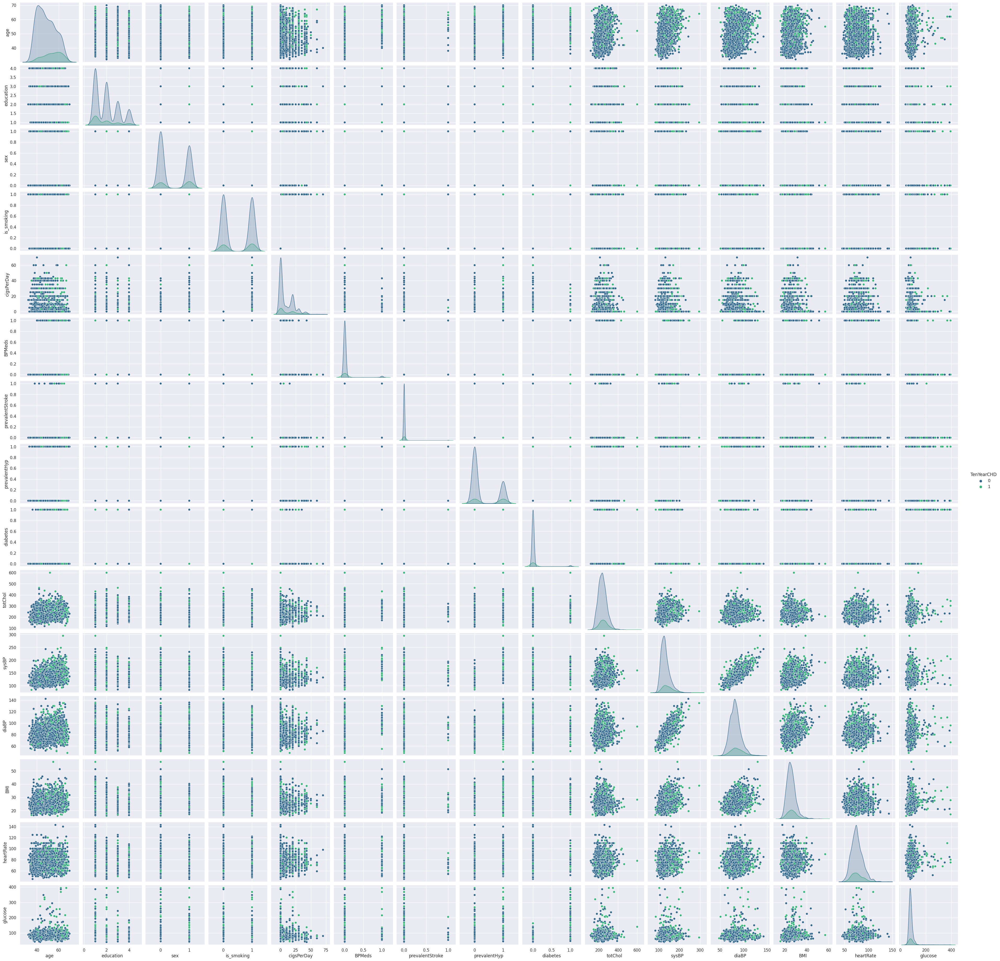

In [ ]:
# Set the style for seaborn
sns.set_theme()

# Create a pair plot for the complete Dataframe
sns.pairplot(df,hue ='TenYearCHD', palette = 'viridis', height=2.5)

#show the plot
plt.show()

### CHART - 17

array([[<Axes: title={'center': 'age'}>,
        <Axes: title={'center': 'education'}>,
        <Axes: title={'center': 'sex'}>,
        <Axes: title={'center': 'is_smoking'}>],
       [<Axes: title={'center': 'cigsPerDay'}>,
        <Axes: title={'center': 'BPMeds'}>,
        <Axes: title={'center': 'prevalentStroke'}>,
        <Axes: title={'center': 'prevalentHyp'}>],
       [<Axes: title={'center': 'diabetes'}>,
        <Axes: title={'center': 'totChol'}>,
        <Axes: title={'center': 'sysBP'}>,
        <Axes: title={'center': 'diaBP'}>],
       [<Axes: title={'center': 'BMI'}>,
        <Axes: title={'center': 'heartRate'}>,
        <Axes: title={'center': 'glucose'}>,
        <Axes: title={'center': 'TenYearCHD'}>]], dtype=object)

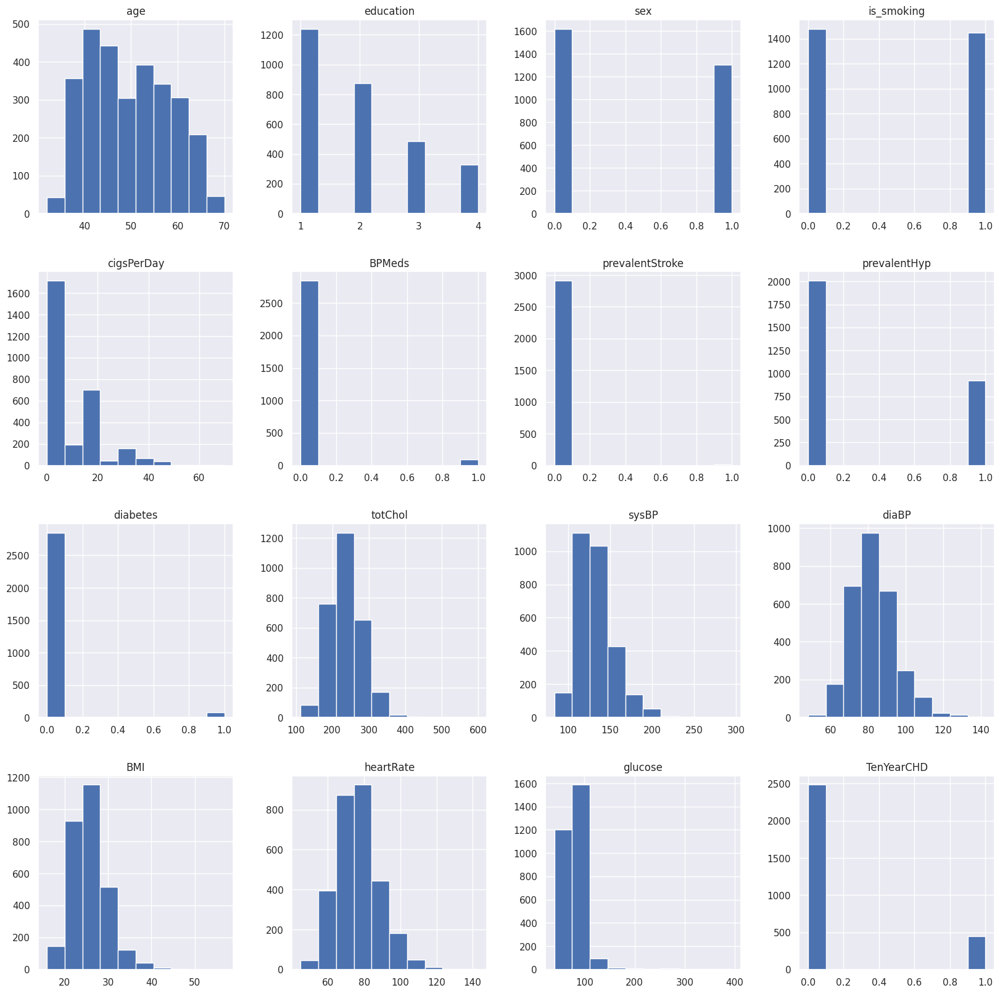

In [ ]:
fig = plt.figure(figsize=(20,20))
ax=fig.gca()
df.hist(ax=ax)

In this data we can see an average age of 49 years, the yougest participants is 32 years old and the oldest reaching 70 years.

Among the participants the highest recorded cigarettes smokes is remarkable 700 per day.

The mean BMI( Body Mass Index) is 25. It's worth noting that BMI levels above 25 but below 30 are typically categorized as overweight, while individuals with BMI values exceeding 30 are considered obese.

The average glucose level is 81, which falls within the range of normal glucose levels, including a healthy distribution of glucose measurements among the study participants.

### CHART - 18 CORREALATION MAP

Looking Truely independent variable

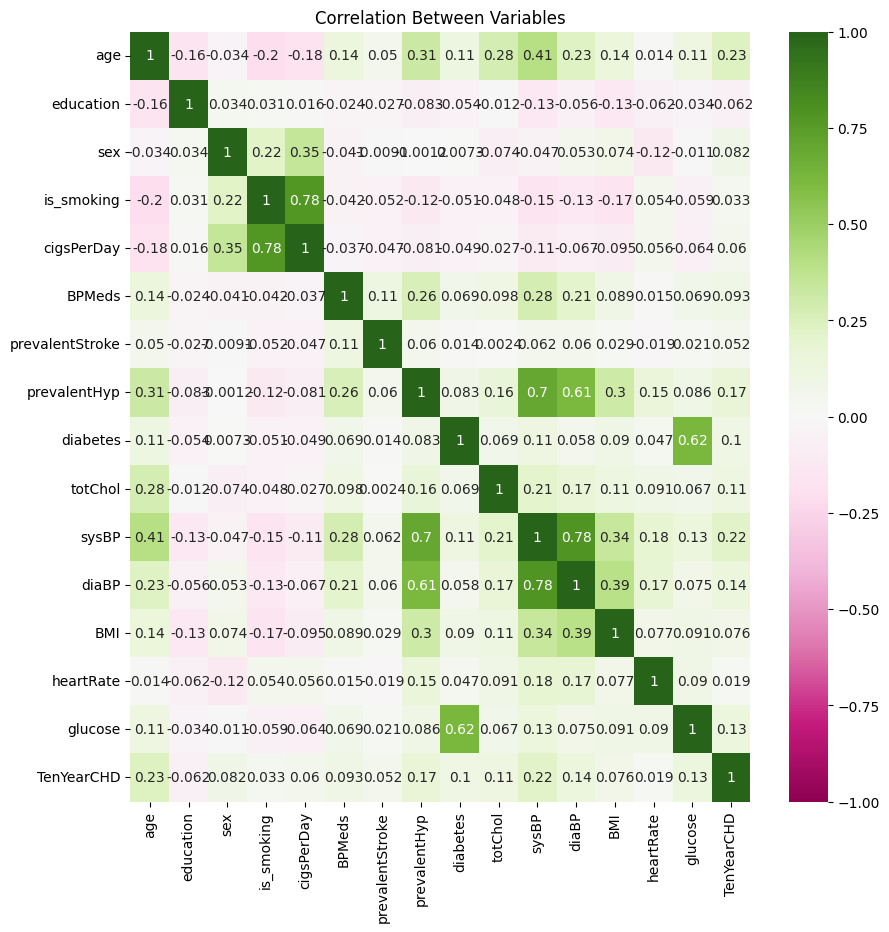

In [ ]:
# Checking multicolinearity
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(), vmin=-1, cmap='PiYG', annot=True)
plt.title('Correlation Between Variables')
plt.show()

###***DATA ENGINEERING***

In [ ]:
# Creating Function for checking VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

  # Calculating VIF
  vif = pd.DataFrame()
  vif["variables"] = X.columns
  vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

  return(vif)

In [ ]:
calc_vif(df[[i for i in df.describe().columns if i not in ['TenYearCHD']]])

,variables,VIF
0,age,41.058242
1,education,4.669405
2,sex,2.203888
3,is_smoking,5.041319
4,cigsPerDay,4.379177
5,BPMeds,1.144204
6,prevalentStroke,1.024945
7,prevalentHyp,2.398267
8,diabetes,1.610730
9,totChol,31.609001


We can see in the table that age, totChol, sysBP, diaBP, BMI, heartRate, glucose showing the high VIF values. Indicate a high degree of multicollinearity, suggesting that the variable is highly correlated with other variables in the model.

In [ ]:
df = df.copy()

In [ ]:
df.drop(['diaBP'], axis=1, inplace=True)

In [ ]:
df.drop(['age'], axis=1, inplace=True)

In [ ]:
df.drop(['totChol'], axis=1, inplace=True)

In [ ]:
df.drop(['BMI'], axis=1, inplace=True)

In [ ]:
df.drop(['heartRate'], axis=1, inplace=True)

In [ ]:
df.drop(['glucose'], axis=1, inplace=True)

In [ ]:
calc_vif(df[[i for i in df.describe().columns if i not in ['TenYearCHD']]])

,variables,VIF
0,education,4.337789
1,sex,2.052057
2,is_smoking,4.968116
3,cigsPerDay,4.336125
4,BPMeds,1.124857
5,prevalentStroke,1.023165
6,prevalentHyp,1.992597
7,diabetes,1.045189
8,sysBP,7.112554


I took some related variable to the data even VIF is little high.

## Preperation of INput and output data

Normalization

In [ ]:
# Creating dependent and independent variable
dependent_variable = 'TenYearCHD'
independent_variables = list(set(df.describe().columns)- {dependent_variable})
print(independent_variables)

['is_smoking', 'prevalentStroke', 'BPMeds', 'education', 'prevalentHyp', 'diabetes', 'cigsPerDay', 'sysBP', 'sex']


In [ ]:
# Creating Normalized input and output dataset
X = np.log10(df[['diabetes', 'cigsPerDay']])
X[list(set(independent_variables)- {'diabetes', 'cigsPerDay'})] = df[list(set(independent_variables)-{'diabetes','cigsPerDay'})]

y = df[dependent_variable]

In [ ]:
X.describe()

,diabetes,cigsPerDay,prevalentStroke,prevalentHyp,sex,BPMeds,sysBP,education,is_smoking
count,2927.0,2927.000000,2927.000000,2927.000000,2927.000000,2927.000000,2927.000000,2927.000000,2927.000000
mean,-inf,-inf,0.006150,0.314315,0.446532,0.030065,132.626409,1.965494,0.494363
std,NaN,NaN,0.078192,0.464322,0.497218,0.170795,22.326197,1.017199,0.500054
min,-inf,-inf,0.000000,0.000000,0.000000,0.000000,83.500000,1.000000,0.000000
25%,NaN,NaN,0.000000,0.000000,0.000000,0.000000,117.000000,1.000000,0.000000
50%,NaN,NaN,0.000000,0.000000,0.000000,0.000000,128.500000,2.000000,0.000000
75%,NaN,1.301030,0.000000,1.000000,1.000000,0.000000,144.000000,3.000000,1.000000
max,0.0,1.845098,1.000000,1.000000,1.000000,1.000000,295.000000,4.000000,1.000000


In [ ]:
# Imputing of infinitevalues with zero
for col in X.columns:
  X[col].replace([np.inf, -np.inf], 0, inplace=True)

In [ ]:
X.describe()

,diabetes,cigsPerDay,prevalentStroke,prevalentHyp,sex,BPMeds,sysBP,education,is_smoking
count,2927.0,2927.000000,2927.000000,2927.000000,2927.000000,2927.000000,2927.000000,2927.000000,2927.000000
mean,0.0,0.573189,0.006150,0.314315,0.446532,0.030065,132.626409,1.965494,0.494363
std,0.0,0.632205,0.078192,0.464322,0.497218,0.170795,22.326197,1.017199,0.500054
min,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,83.500000,1.000000,0.000000
25%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,117.000000,1.000000,0.000000
50%,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,128.500000,2.000000,0.000000
75%,0.0,1.301030,0.000000,1.000000,1.000000,0.000000,144.000000,3.000000,1.000000
max,0.0,1.845098,1.000000,1.000000,1.000000,1.000000,295.000000,4.000000,1.000000


## Train Test Split

In [ ]:
# Splitting the data into train and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

## Scaling

In [ ]:
# Standardization of Input Data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
X_train.shape

(2341, 9)

In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 7.7 MB/s eta 0:00:00


In [ ]:
import shap
shap.initjs()

###***ML Model Implementation***

## Model - 1

In [ ]:
# Model cross validation and hyperparameter tuning
model_rf = RandomForestClassifier()
parameters = {'n_estimators':[int(x) for x in np.linspace(50,500, num=10)],
              'max_depth' :[int(x) for x in np.linspace(5,30,num=6)],
              'max_features': ['auto', 'sqrt'],
              'min_samples_split':[2,5,10,15,100],
              'min_samples_leaf':[1,2,5,10]}
model_rf_cv = RandomizedSearchCV(model_rf, param_distributions= parameters, scoring='r2', cv=3, random_state=0)
model_rf_cv.fit(X_train,y_train)

RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(),
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [50, 100, 150, 200, 250,
                                                         300, 350, 400, 450,
                                                         500]},
                   random_state=0, scoring='r2')

In [ ]:
model_rf_cv.best_params_

{'n_estimators': 100,
 'min_samples_split': 15,
 'min_samples_leaf': 5,
 'max_features': 'auto',
 'max_depth': 25}

In [ ]:
model_rf_final = RandomForestClassifier(max_depth = 25, max_features = 'auto',
                                        min_samples_leaf = 5, min_samples_split = 15,
                                        n_estimators = 100)
model_rf_final.fit(X_train, y_train)

RandomForestClassifier(max_depth=25, max_features='auto', min_samples_leaf=5,
                       min_samples_split=15)

In [ ]:
# Checkking model performance for train set
y_train_preds_rf = model_rf_final.predict(X_train)
rf_train_accuracy = round(accuracy_score(y_train, y_train_preds_rf),2)
print("Accuracy:", rf_train_accuracy)
rf_train_f1 = round(f1_score(y_train, y_train_preds_rf, average='macro'),2)
print("F1:", rf_train_f1)
rf_train_roc = round(roc_auc_score(y_train, y_train_preds_rf),2)
print("ROC_AUC_Score:", rf_train_roc)

Accuracy: 0.86
F1: 0.52
ROC_AUC_Score: 0.53


In [ ]:
# Checkking model performance for test set
y_test_preds_rf = model_rf_final.predict(X_test)
rf_test_accuracy = round(accuracy_score(y_test, y_test_preds_rf),2)
print("Accuracy:", rf_test_accuracy)
rf_test_f1 = round(f1_score(y_test, y_test_preds_rf, average='macro'),2)
print("F1:", rf_test_f1)
rf_test_roc = round(roc_auc_score(y_test, y_test_preds_rf),2)
print("ROC_AUC_Score:", rf_test_roc)

Accuracy: 0.83
F1: 0.47
ROC_AUC_Score: 0.5


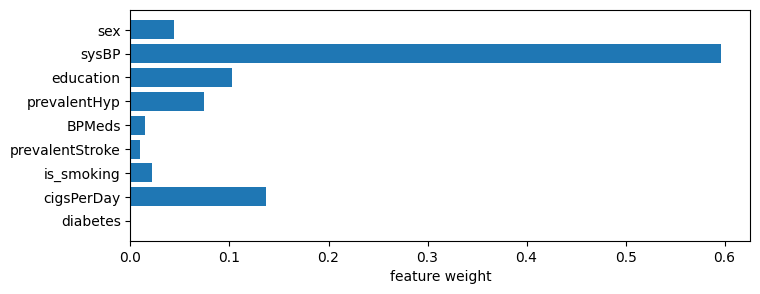

In [ ]:
# Checking Feature Importance
plt.figure(figsize=(8,3))
y=list(X.columns)
x=list(model_rf_final.feature_importances_)
plt.barh(y,x)
plt.xlabel('feature weight')
plt.show()

##Model -2

In [ ]:
# Model cross validation and hyperparameter tuning
model_knn = KNeighborsClassifier()
parameters = {'n_neighbors':[int(x) for x in np.linspace(3,21,num=10)],
              'leaf_size':[int(x) for x in np.linspace(10,50,num=5)]}
model_knn_cv = RandomizedSearchCV(model_knn, param_distributions=parameters, scoring='r2', cv=3, random_state=0)
model_knn_cv.fit(X_train,y_train)

RandomizedSearchCV(cv=3, estimator=KNeighborsClassifier(),
                   param_distributions={'leaf_size': [10, 20, 30, 40, 50],
                                        'n_neighbors': [3, 5, 7, 9, 11, 13, 15,
                                                        17, 19, 21]},
                   random_state=0, scoring='r2')

In [ ]:
model_knn_cv.best_params_

{'n_neighbors': 17, 'leaf_size': 30}

In [ ]:
model_knn_final = KNeighborsClassifier(n_neighbors=17, leaf_size = 30)
model_knn_final.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=17)

In [ ]:
# Checking model performance for train set
y_train_preds_knn = model_knn_final.predict(X_train)
knn_train_accuracy = round(accuracy_score(y_train,y_train_preds_knn),2)
print("Accuracy:", knn_train_accuracy)
knn_train_f1 = round(f1_score(y_train, y_train_preds_knn, average='macro'),2)
print("F1:", knn_train_f1)
knn_train_roc=round(roc_auc_score(y_train,y_train_preds_knn),2)
print("ROC_AUC_Score:", knn_train_roc)

Accuracy: 0.85
F1: 0.5
ROC_AUC_Score: 0.52


In [ ]:
# Checking model performance for test set
y_test_preds_knn = model_knn_final.predict(X_test)
knn_test_accuracy = round(accuracy_score(y_test,y_test_preds_knn),2)
print("Accuracy:", knn_test_accuracy)
knn_test_f1 = round(f1_score(y_test, y_test_preds_knn, average='macro'),2)
print("F1:", knn_test_f1)
knn_test_roc=round(roc_auc_score(y_test,y_test_preds_knn),2)
print("ROC_AUC_Score:", knn_test_roc)

Accuracy: 0.84
F1: 0.48
ROC_AUC_Score: 0.51


  0%|          | 0/586 [00:00<?, ?it/s]

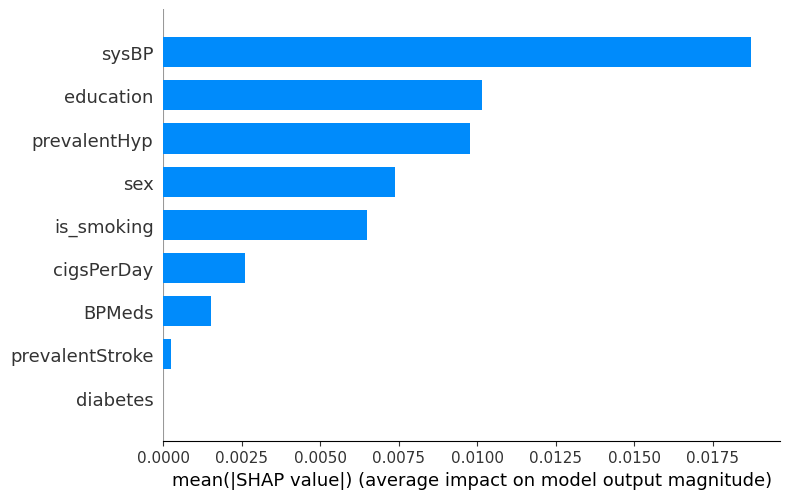

In [ ]:
# Checking Feature Importance
shap_values = shap.KernelExplainer(model_knn_final.predict, X_train[100:150], link = 'identity').shap_values(X_test)
shap.summary_plot(shap_values, X_test,feature_names=list(X.columns), plot_type="bar")

  0%|          | 0/586 [00:00<?, ?it/s]

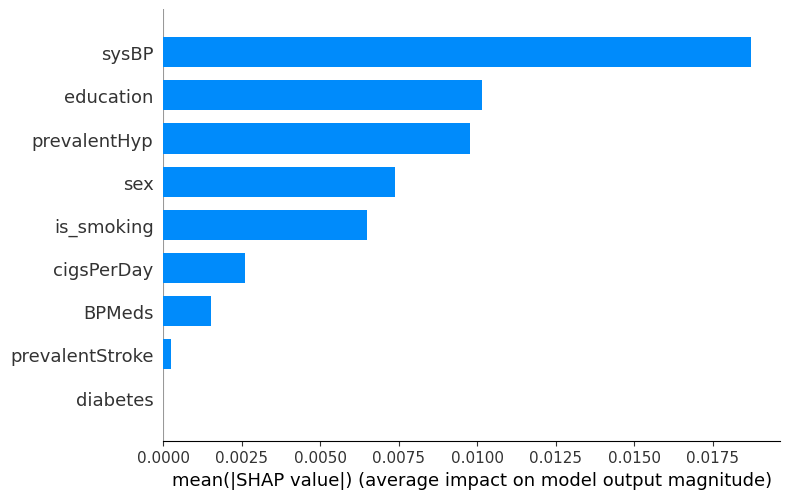

In [ ]:
# Checking Feature importance
shap_values = shap.KernelExplainer(model_knn_final.predict, X_train[100:150], link='identity').shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=list(X.columns), plot_type="bar")

  0%|          | 0/586 [00:00<?, ?it/s]

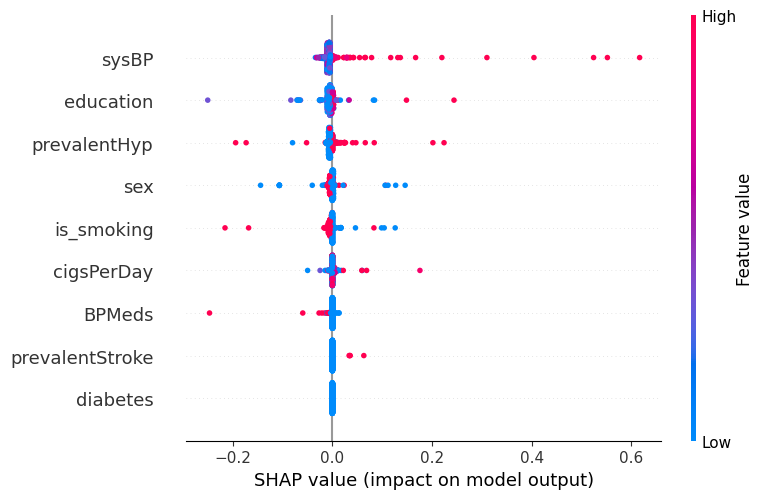

In [ ]:
# Checking feature importance
shap_values = shap.KernelExplainer(model_knn_final.predict, X_train[100:150], link='identity').shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=list(X.columns), plot_type='dot')

## Model - 3

In [ ]:
# Model cross validation and hyperparameter tuning
model_svc = SVC()
parameters = {'gamma':[0.1, 0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
              'C':[int(x) for x in np.linspace(1,10,num=10)]}
model_svc_cv = RandomizedSearchCV(model_svc, param_distributions = parameters, scoring='r2', cv=3, random_state=0)
model_svc_cv.fit(X_train, y_train)

RandomizedSearchCV(cv=3, estimator=SVC(),
                   param_distributions={'C': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                                        'gamma': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6,
                                                  0.7, 0.8, 0.9]},
                   random_state=0, scoring='r2')

In [ ]:
model_svc_cv.best_params_

{'gamma': 0.3, 'C': 1}

In [ ]:
model_svc_final = SVC(C=6, gamma=0.1)
model_svc_final.fit(X_train,y_train)

SVC(C=6, gamma=0.1)

In [ ]:
# Checking model performance for train set
y_train_preds_svc = model_svc_final.predict(X_train)
svc_train_accuracy = round(accuracy_score(y_train, y_train_preds_svc),2)
print("Accuracy:", svc_train_accuracy)
svc_train_f1 = round(f1_score(y_train, y_train_preds_svc, average='macro'),2)
print("F1:", svc_train_f1)
svc_train_roc = round(roc_auc_score(y_train, y_train_preds_svc),2)
print("ROC_AUC_Score:", svc_train_roc)

Accuracy: 0.86
F1: 0.51
ROC_AUC_Score: 0.53


In [ ]:
# Checking model performance for test set
y_test_preds_svc = model_svc_final.predict(X_test)
svc_test_accuracy = round(accuracy_score(y_test, y_test_preds_svc),2)
print("Accuracy:", svc_test_accuracy)
svc_test_f1 = round(f1_score(y_test, y_test_preds_svc, average='macro'),2)
print("F1:", svc_test_f1)
svc_test_roc = round(roc_auc_score(y_test, y_test_preds_svc),2)
print("ROC_AUC_Score:", svc_test_roc)

Accuracy: 0.83
F1: 0.46
ROC_AUC_Score: 0.5


  0%|          | 0/586 [00:00<?, ?it/s]

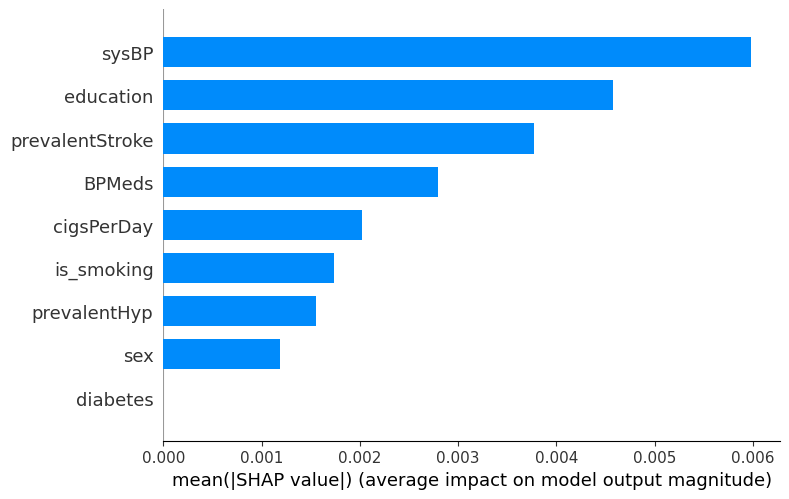

In [ ]:
# Checking Feature Importance
shap_values = shap.KernelExplainer(model_svc_final.predict, X_train[100:150], link = 'identity').shap_values(X_test)
shap.summary_plot(shap_values, X_test, feature_names=list(X.columns), plot_type='bar' )

## Conclusion

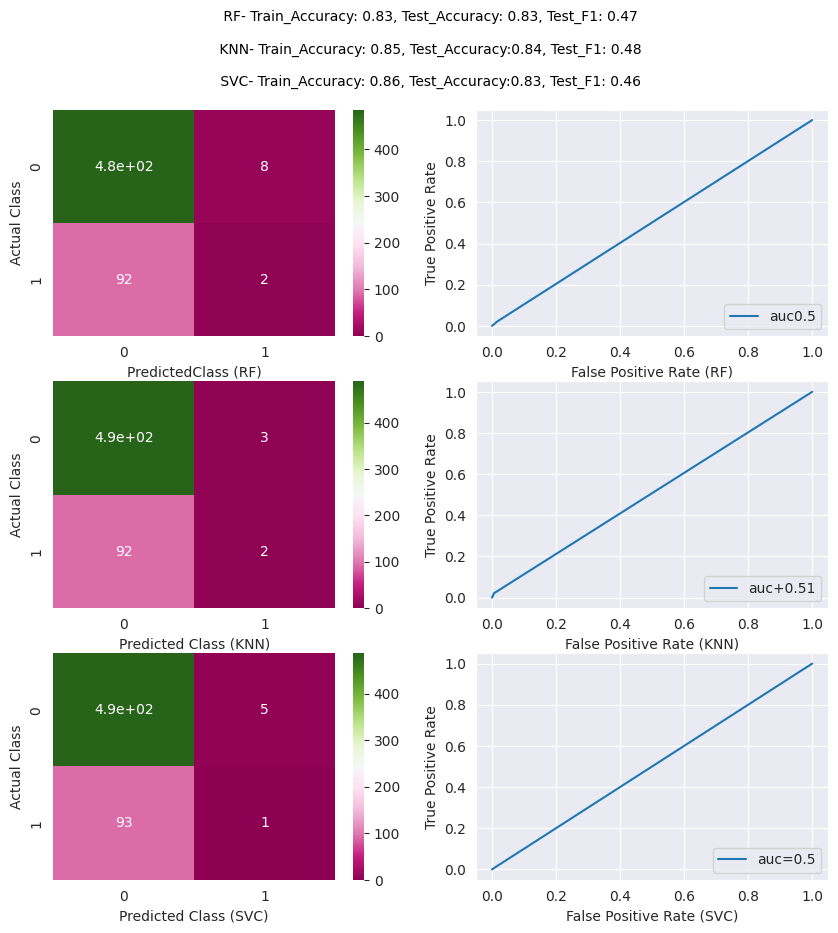

In [ ]:
# Performance Comparison of Models
plt.figure(figsize =(10,10))
plt.suptitle(f" RF- Train_Accuracy: {rf_train_accuracy}, Test_Accuracy: {rf_test_accuracy}, Test_F1: {rf_test_f1}\n\n KNN- Train_Accuracy: {knn_train_accuracy}, Test_Accuracy:{knn_test_accuracy}, Test_F1: {knn_test_f1}\n\n SVC- Train_Accuracy: {svc_train_accuracy}, Test_Accuracy:{svc_test_accuracy}, Test_F1: {svc_test_f1}", fontsize=10)
sns.set_style("darkgrid")

plt.subplot(3,2,1)
rf_test_cm = confusion_matrix(y_test, y_test_preds_rf)
sns.heatmap(rf_test_cm, vmin=0, cmap='PiYG', annot=True)
plt.xlabel('PredictedClass (RF)')
plt.ylabel('Actual Class')

plt.subplot(3,2,2)
fpr, tpr, _ = roc_curve(y_test, y_test_preds_rf)
plt.plot(fpr,tpr,label="auc"+str(rf_test_roc))
plt.legend(loc=4)
plt.xlabel("False Positive Rate (RF)")
plt.ylabel('True Positive Rate')

plt.subplot(3,2,3)
knn_test_cm = confusion_matrix(y_test, y_test_preds_knn)
sns.heatmap(knn_test_cm, vmin=0, cmap='PiYG', annot=True)
plt.xlabel("Predicted Class (KNN)")
plt.ylabel("Actual Class")

plt.subplot(3,2,4)
fpr, tpr, _ = roc_curve(y_test, y_test_preds_knn)
plt.plot(fpr,tpr,label="auc+" + str(knn_test_roc))
plt.legend(loc=4)
plt.xlabel("False Positive Rate (KNN)")
plt.ylabel("True Positive Rate")

plt.subplot(3,2,5)
svc_test_cm = confusion_matrix(y_test, y_test_preds_svc)
sns.heatmap(svc_test_cm, vmin=0, cmap='PiYG', annot=True)
plt.xlabel("Predicted Class (SVC)")
plt.ylabel('Actual Class')

plt.subplot(3,2,6)
fpr, tpr,_ = roc_curve(y_test, y_test_preds_svc)
plt.plot(fpr,tpr,label="auc="+str(svc_test_roc))
plt.legend(loc=4)
plt.xlabel('False Positive Rate (SVC)')
plt.ylabel('True Positive Rate')

plt.show()

In our final Random Forest model, test accuracy is 83%

In our final KNN model, test accuracy is 84%

In our final SVC model, test accuracy is 83%

On the basis of performance study of our three models, we are selecting KNN classifier (the best warrior) for predicting 10 Years Coronary heart disease, as it has low variance in prediction, good f1_score and good ROC_AUC score among all three models.

In this healthcare-focused project, we harnessed the power of machine learning to extract meaningfull insights from medical data.

our primary objective was to develop a predictive model that could assist in health-related decision--making.

After rigorous experimentation with ultiple machine learning algorithms, the KNN emerged as the standout performer. It achieved an accuracy rate of 84%. This signifies that KNN excels in accurately identifying health outcomes, which is crucial for medical professionals and patients alike.

These findings hold immense promise for the healthcare domain. The ability to predict health outcomes with such precision can revolutionize patient care, leading to earlier disease detection, tailored treatment plans and optimized healthcare resource allocation. It empowers medical practitionerswith data-driven insightsto make informed decisions, ultimately improving patient well-beibg.

Beyond healthcare, this project underscores the transformative potential of machine learning across various sectors. By harnessing data, we can drive innovation, enhance decision-making and contribute to a brighter and healthier future for all.

### ***THANK YOU***